# Code dossier basket universitaire

## Importation des packages et des fonctions

In [114]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import warnings
import tensorflow as tf
from tensorflow import keras
from sklearn.svm import SVC
from sklearn.svm import LinearSVC 
from sklearn.linear_model import SGDClassifier , LogisticRegression , ElasticNet
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score ,learning_curve ,GridSearchCV ,RepeatedKFold ,train_test_split
from sklearn.multiclass import OneVsOneClassifier , OneVsRestClassifier
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn_evaluation import plot
from scikeras.wrappers import KerasClassifier, KerasRegressor
%matplotlib inline

In [115]:
def plot_svc_decision_boundary(svm_clf, xmin, xmax):
    
    '''
    
    SEULEMENT pour la fonction SVC de sklearn, pas de LINEARSVC
    
    Function qui permet de recupérer la constante et le coefficient directeur
    d'un svm après entraintement.
    
    Un svm lineaire est de la forme w0*w0+w1*x1 +b =0
    donc 
    >= x1= -w0/w1 *x0 -b/w1
    
    avoir x1 en fonction de x0 permet de tracer la zone de décision du SVM 
    et ainsi avoir une réprésentation graphique
    
    Pour calculer les marges on rajoute +- 1/w[1]
    
    
    '''
    
    w = svm_clf.coef_[0]
    b = svm_clf.intercept_[0]

    # At the decision boundary, w0*x0 + w1*x1 + b = 0
    # => x1 = -w0/w1 * x0 - b/w1
    x0 = np.linspace(xmin, xmax, 200)
    decision_boundary = -w[0]/w[1] * x0 - b/w[1]

    margin = 1/w[1]
    gutter_up = decision_boundary + margin
    gutter_down = decision_boundary - margin

    svs = svm_clf.support_vectors_
    plt.scatter(svs[:, 0], svs[:, 1], s=180, facecolors='#FFAAAA')
    plt.plot(x0, decision_boundary, "k-", linewidth=2)
    plt.plot(x0, gutter_up, "k--", linewidth=2)
    plt.plot(x0, gutter_down, "k--", linewidth=2)

In [116]:
def svm_f_importances(coef_svm , names):
    ''' 
    Cette fonction permet de visualiser l'importance de chaque variable pour le modèle SVM
    Vous devez passer 2 arguments :
    
    - coef_svm : Les coéfficients du modèle disponible après votre .fit()
      On le récupère avec la commande suite  svc_fit.coef_[0]
      
    - names : est le nom des features que vous avez utilisée.
      ATTENTION à passer dans le même ordre que pour l'entrainement du modèle
    
    '''
    imp = coef_svm
    imp,names = zip(*sorted(zip(imp,names)))
    plt.barh(range(len(names)), imp, align='center')
    plt.yticks(range(len(names)), names)
    plt.show()

#features_names = ['input1', 'input2']
#svm = svm.SVC(kernel='linear')
#svm.fit(X, Y)
#f_importances(svm.coef_[0], features_names)

## Importation des données

In [117]:
columns_name = ['player_name','team','conf','GP','Min_per','Ortg','usg','eFG','TS_per','ORB_per','DRB_per','AST_per','TO_per','FTM','FTA','FT_per','twoPM','twoPA','twoP_per','TPM','TPA','TP_per','blk_per','stl_per','ftr','yr','ht','num','porpag','adjoe','pfr','year','pid','type','Rec_Rank','ast/tov','rimmade','rimmade+rimmiss','midmade','midmade+midmiss','rimmade/(rimmade+rimmiss)','midmade/(midmade+midmiss)','dunksmade','dunksmiss+dunksmade','dunksmade/(dunksmade+dunksmiss)','pick','drtg','adrtg','dporpag','stops','bpm','obpm','dbpm','gbpm','mp','ogbpm','dgbpm','oreb','dreb','treb','ast','stl','blk','pts','post','delete']

df = pd.read_csv('archive/CollegeBasketballPlayers2009-2021.csv',
                 sep=',',
                 names=columns_name,
                 header=0,
                 skipinitialspace=True
                 )

In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61061 entries, 0 to 61060
Data columns (total 66 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   player_name                      61061 non-null  object 
 1   team                             61061 non-null  object 
 2   conf                             61061 non-null  object 
 3   GP                               61061 non-null  int64  
 4   Min_per                          61061 non-null  float64
 5   Ortg                             61061 non-null  float64
 6   usg                              61061 non-null  float64
 7   eFG                              61061 non-null  float64
 8   TS_per                           61061 non-null  float64
 9   ORB_per                          61061 non-null  float64
 10  DRB_per                          61061 non-null  float64
 11  AST_per                          61061 non-null  float64
 12  TO_per            

### On supprime les colonnes inutiles 

In [119]:
df2=df.drop(labels=['yr','num','year','pid','type','delete','pick'],
               axis=1)
df2.head()

,player_name,team,conf,GP,Min_per,Ortg,usg,eFG,TS_per,ORB_per,...,ogbpm,dgbpm,oreb,dreb,treb,ast,stl,blk,pts,post
0,DeAndrae Ross,South Alabama,SB,26,29.5,97.3,16.6,42.5,44.43,1.6,...,-2.781990,-1.941150,0.1923,0.6154,0.8077,1.1923,0.3462,0.0385,3.8846,NaN
1,Pooh Williams,Utah St.,WAC,34,60.9,108.3,14.9,52.4,54.48,3.8,...,-0.052263,-0.247934,0.6765,1.2647,1.9412,1.8235,0.4118,0.2353,5.9412,NaN
2,Jesus Verdejo,South Florida,BE,27,72.0,96.2,21.8,45.7,47.98,2.1,...,1.548230,-0.883163,0.6296,2.3333,2.9630,1.9630,0.4815,0.0000,12.1852,NaN
3,Mike Hornbuckle,Pepperdine,WCC,30,44.5,97.7,16.0,53.6,53.69,4.1,...,-0.342775,-0.393459,0.7000,1.4333,2.1333,1.1000,0.5667,0.1333,4.9333,NaN
4,Anthony Brown,Pacific,BW,33,56.2,96.5,22.0,52.8,54.31,8.3,...,-1.684860,-0.668318,1.4242,3.3030,4.7273,0.8485,0.4545,0.3333,7.5758,NaN


### Recodage 

In [120]:
df2.ht

0         2-Jun
1         4-Jun
2         4-Jun
3         4-Jun
4         8-Jun
          ...  
61056     8-Jun
61057    11-Jun
61058       NaN
61059       NaN
61060     8-Jun
Name: ht, Length: 61061, dtype: object

In [121]:
df2['ht'] = df2['ht'].map({'1-May':155,'10-May':178,'11-May':180,'2-May':157,'3-May':160,'4-May':163,'5-Apr':135,'5-May':165,'6-May':168,'7-May':170,'8-May':173,'9-May':175,'Apr-00':193,'Jun-00':183,'Jul-00':213,'1-Jun':185,'2-Jun':188,'3-Jun':191,'4-Jun':193,'5-Jun':196,'6-Jun':198,'7-Jun':201,'8-Jun':203,'9-Jun':206,'10-Jun':208,'11-Jun':211,'1-Jul':216,'2-Jul':218,'3-Jul':221,'4-Jul':224,'5-Jul':226,'6-Jul':229},
                             na_action=None)
df2.ht

0        188.0
1        193.0
2        193.0
3        193.0
4        203.0
         ...  
61056    203.0
61057    211.0
61058      NaN
61059      NaN
61060    203.0
Name: ht, Length: 61061, dtype: float64

In [122]:
df2.ht[9269]

nan

In [123]:
df2.ht[6994]

nan

### Valeurs manquantes 

In [124]:
print(df2.isnull().sum())

player_name                            0
team                                   0
conf                                   0
GP                                     0
Min_per                                0
Ortg                                   0
usg                                    0
eFG                                    0
TS_per                                 0
ORB_per                                0
DRB_per                                0
AST_per                                0
TO_per                                 0
FTM                                    0
FTA                                    0
FT_per                                 0
twoPM                                  0
twoPA                                  0
twoP_per                               0
TPM                                    0
TPA                                    0
TP_per                                 0
blk_per                                0
stl_per                                0
ftr             

In [125]:
df3 = df2.dropna(axis=0)
df3.shape

(11170, 59)

## Statistiques descriptives

In [126]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11170 entries, 4594 to 61047
Data columns (total 59 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   player_name                      11170 non-null  object 
 1   team                             11170 non-null  object 
 2   conf                             11170 non-null  object 
 3   GP                               11170 non-null  int64  
 4   Min_per                          11170 non-null  float64
 5   Ortg                             11170 non-null  float64
 6   usg                              11170 non-null  float64
 7   eFG                              11170 non-null  float64
 8   TS_per                           11170 non-null  float64
 9   ORB_per                          11170 non-null  float64
 10  DRB_per                          11170 non-null  float64
 11  AST_per                          11170 non-null  float64
 12  TO_per         

In [127]:
df3

,player_name,team,conf,GP,Min_per,Ortg,usg,eFG,TS_per,ORB_per,...,ogbpm,dgbpm,oreb,dreb,treb,ast,stl,blk,pts,post
4594,Carlos Strong,Boston University,AE,35,76.2,118.1,16.4,58.8,60.93,4.7,...,2.914710,2.338340,1.3429,3.2286,4.5714,1.8000,1.6571,0.4000,10.8571,Combo G
4600,Corey Lowe,Boston University,AE,32,75.7,91.5,28.9,46.3,49.32,3.1,...,1.678070,-0.505561,0.9688,3.5000,4.4688,4.2500,1.2500,0.4062,15.0312,Scoring PG
4612,Matt Parker,James Madison,CAA,27,21.7,87.9,16.2,45.2,45.32,2.9,...,-3.865000,-1.647590,0.2593,0.9630,1.2222,0.3704,0.1481,0.2963,2.8519,Stretch 4
4617,Landon Milbourne,Maryland,ACC,32,73.6,109.2,20.1,51.5,54.44,7.2,...,2.262140,1.599990,1.9062,3.0938,5.0000,0.7812,1.1562,1.1875,12.7500,Wing F
4619,Vernon Macklin,Florida,SEC,34,62.5,116.3,19.8,60.7,60.85,11.9,...,3.802010,1.053410,2.6765,2.8529,5.5294,0.7647,0.5882,0.8529,10.5588,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60992,Sion James,Tulane,Amer,23,64.9,89.5,15.6,46.6,51.34,2.0,...,-3.222900,1.894790,0.4783,3.0435,3.5217,1.9130,1.2174,0.2174,5.8261,Wing G
61014,Ty Harper,Louisiana Lafayette,SB,20,40.0,88.7,18.2,46.4,50.12,2.6,...,-3.725650,-1.861870,0.4500,1.2500,1.7000,1.2000,0.4500,0.0500,5.6000,Combo G
61034,Franck Kepnang,Oregon,P12,16,12.9,129.5,13.2,67.9,65.84,8.5,...,1.368160,4.294650,0.6250,0.6250,1.2500,0.1250,0.1250,1.1250,2.8125,C
61046,David Jones,DePaul,BE,9,17.1,86.9,21.8,39.1,40.09,7.3,...,-1.246090,0.529388,1.0000,1.6667,2.6667,0.4444,0.4444,0.2222,5.1111,Wing F


In [128]:
s = pd.Series(range(0,11170))
df4 = df3.set_index(s)
df4

,player_name,team,conf,GP,Min_per,Ortg,usg,eFG,TS_per,ORB_per,...,ogbpm,dgbpm,oreb,dreb,treb,ast,stl,blk,pts,post
0,Carlos Strong,Boston University,AE,35,76.2,118.1,16.4,58.8,60.93,4.7,...,2.914710,2.338340,1.3429,3.2286,4.5714,1.8000,1.6571,0.4000,10.8571,Combo G
1,Corey Lowe,Boston University,AE,32,75.7,91.5,28.9,46.3,49.32,3.1,...,1.678070,-0.505561,0.9688,3.5000,4.4688,4.2500,1.2500,0.4062,15.0312,Scoring PG
2,Matt Parker,James Madison,CAA,27,21.7,87.9,16.2,45.2,45.32,2.9,...,-3.865000,-1.647590,0.2593,0.9630,1.2222,0.3704,0.1481,0.2963,2.8519,Stretch 4
3,Landon Milbourne,Maryland,ACC,32,73.6,109.2,20.1,51.5,54.44,7.2,...,2.262140,1.599990,1.9062,3.0938,5.0000,0.7812,1.1562,1.1875,12.7500,Wing F
4,Vernon Macklin,Florida,SEC,34,62.5,116.3,19.8,60.7,60.85,11.9,...,3.802010,1.053410,2.6765,2.8529,5.5294,0.7647,0.5882,0.8529,10.5588,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11165,Sion James,Tulane,Amer,23,64.9,89.5,15.6,46.6,51.34,2.0,...,-3.222900,1.894790,0.4783,3.0435,3.5217,1.9130,1.2174,0.2174,5.8261,Wing G
11166,Ty Harper,Louisiana Lafayette,SB,20,40.0,88.7,18.2,46.4,50.12,2.6,...,-3.725650,-1.861870,0.4500,1.2500,1.7000,1.2000,0.4500,0.0500,5.6000,Combo G
11167,Franck Kepnang,Oregon,P12,16,12.9,129.5,13.2,67.9,65.84,8.5,...,1.368160,4.294650,0.6250,0.6250,1.2500,0.1250,0.1250,1.1250,2.8125,C
11168,David Jones,DePaul,BE,9,17.1,86.9,21.8,39.1,40.09,7.3,...,-1.246090,0.529388,1.0000,1.6667,2.6667,0.4444,0.4444,0.2222,5.1111,Wing F


In [129]:
df4.describe()

,GP,Min_per,Ortg,usg,eFG,TS_per,ORB_per,DRB_per,AST_per,TO_per,...,mp,ogbpm,dgbpm,oreb,dreb,treb,ast,stl,blk,pts
count,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,...,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000
mean,28.890689,50.955604,102.036759,19.817529,50.360125,53.167443,6.760689,14.508890,10.893626,18.896920,...,22.099915,0.315018,1.060816,1.192912,2.804106,3.997018,1.326159,0.690492,0.525218,8.282294
std,6.542830,23.552778,12.511522,4.726337,7.640879,6.979456,3.956327,4.934772,7.179085,5.587783,...,8.749143,3.331046,1.739977,0.795910,1.504548,2.127398,1.177447,0.457977,0.537623,4.893324
min,1.000000,0.600000,15.900000,6.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.428600,-24.636900,-8.866680,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,32.300000,94.900000,16.400000,46.025000,49.400000,3.400000,10.800000,5.700000,15.100000,...,15.216275,-1.779690,-0.083675,0.566700,1.676500,2.407400,0.451600,0.342900,0.166700,4.154400
50%,31.000000,54.000000,103.000000,19.600000,50.300000,53.570000,6.400000,14.000000,9.400000,18.300000,...,23.369050,0.418860,1.056825,1.000000,2.606100,3.642900,1.000000,0.612900,0.352900,7.763300
75%,33.000000,70.700000,110.200000,22.900000,54.900000,57.550000,9.600000,17.600000,14.300000,21.800000,...,29.437500,2.569867,2.170427,1.666700,3.693225,5.257100,1.832125,0.950000,0.689700,11.777800
max,41.000000,96.700000,178.400000,42.800000,100.000000,101.690000,33.600000,43.100000,51.900000,68.500000,...,39.322600,19.528700,10.470200,5.769200,9.878800,13.300000,8.083300,3.444400,4.722200,29.305600


In [130]:
df4.iloc[:,[0,1,2,58]].describe()

,player_name,team,conf,post
count,11170,11170,11170,11170
unique,4790,349,35,8
top,Justin Jackson,Kansas,ACC,C
freq,9,108,1168,2607


In [131]:
df4.iloc[:,3:57].describe()

,GP,Min_per,Ortg,usg,eFG,TS_per,ORB_per,DRB_per,AST_per,TO_per,...,gbpm,mp,ogbpm,dgbpm,oreb,dreb,treb,ast,stl,blk
count,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,...,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000,11170.000000
mean,28.890689,50.955604,102.036759,19.817529,50.360125,53.167443,6.760689,14.508890,10.893626,18.896920,...,1.375833,22.099915,0.315018,1.060816,1.192912,2.804106,3.997018,1.326159,0.690492,0.525218
std,6.542830,23.552778,12.511522,4.726337,7.640879,6.979456,3.956327,4.934772,7.179085,5.587783,...,4.084951,8.749143,3.331046,1.739977,0.795910,1.504548,2.127398,1.177447,0.457977,0.537623
min,1.000000,0.600000,15.900000,6.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-31.161000,1.428600,-24.636900,-8.866680,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,32.300000,94.900000,16.400000,46.025000,49.400000,3.400000,10.800000,5.700000,15.100000,...,-1.167358,15.216275,-1.779690,-0.083675,0.566700,1.676500,2.407400,0.451600,0.342900,0.166700
50%,31.000000,54.000000,103.000000,19.600000,50.300000,53.570000,6.400000,14.000000,9.400000,18.300000,...,1.484980,23.369050,0.418860,1.056825,1.000000,2.606100,3.642900,1.000000,0.612900,0.352900
75%,33.000000,70.700000,110.200000,22.900000,54.900000,57.550000,9.600000,17.600000,14.300000,21.800000,...,4.138467,29.437500,2.569867,2.170427,1.666700,3.693225,5.257100,1.832125,0.950000,0.689700
max,41.000000,96.700000,178.400000,42.800000,100.000000,101.690000,33.600000,43.100000,51.900000,68.500000,...,24.986000,39.322600,19.528700,10.470200,5.769200,9.878800,13.300000,8.083300,3.444400,4.722200


## Valeurs atypiques

In [19]:
def grubbs_stat(y):
    std_dev = np.std(y)
    avg_y = np.mean(y)
    abs_val_minus_avg = abs(y - avg_y)
    max_of_deviations = max(abs_val_minus_avg)
    max_ind = np.argmax(abs_val_minus_avg)
    Gcal = max_of_deviations/ std_dev
    #print("Grubbs Statistics Value : {}".format(Gcal))
    return Gcal, max_ind

def calculate_critical_value(size, alpha):
    t_dist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(t_dist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(t_dist))
    critical_value = numerator / denominator
    #print("Grubbs Critical Value: {}".format(critical_value))
    return critical_value

#ESD test
def ESD_Test(input_series, alpha, max_outliers):
    input_series = np.array(input_series) #Transformation de la colonne en array
    
    #Initialisation des valeurs
    nb_outliers=0
    valeur_atypique_seuil="-"

    
    #Itération pour chaque valeur de la série
    for iterations in range(max_outliers):
        Gcritical = calculate_critical_value(len(input_series), alpha)
        Gstat, max_index = grubbs_stat(input_series)
        
        #Récupère les valeurs de la dernière itération où la valeur est considéré comme atypique
        if round(Gstat,4)>round(Gcritical,4) :
            nb_outliers+=1
            valeur_atypique_seuil=input_series[max_index]
            last_Gstat=Gstat
            last_Gcritical=Gcritical
        
        #Supprime la valeur de l'itération pour tester sur d'autres
        input_series = np.delete(input_series, max_index)
   
    #Print des résultats du test
    print("Nombre de valeurs atypiques : "+ str(nb_outliers))
    print("Valeur atypique seuil : {}".format(valeur_atypique_seuil))
    
    if nb_outliers>0 :
        print('{} is an outlier. G > G-critical: {:.4f} > {:.4f} \n'.format(valeur_atypique_seuil, last_Gstat, last_Gcritical))
    
    if (max_outliers*0.8)<nb_outliers : #Marge de sécurité
        print('\033[1m' + "Veuillez augmenter le nombre d'outlier max par sécurité"+'\033[0m')
    
    return valeur_atypique_seuil

In [20]:
columns_name=df4.columns
for i in range(3,58) :
    print(columns_name[i])
    ESD_Test(df4.iloc[:,i], 0.05, 1000)
    print('-----------------------------------------------')

GP
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
Min_per
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
Ortg
Nombre de valeurs atypiques : 19
Valeur atypique seuil : 44.8
44.8 is an outlier. G > G-critical: 4.6833 > 4.5855 

-----------------------------------------------
usg
Nombre de valeurs atypiques : 1
Valeur atypique seuil : 42.8
42.8 is an outlier. G > G-critical: 4.8629 > 4.5859 

-----------------------------------------------
eFG
Nombre de valeurs atypiques : 13
Valeur atypique seuil : 15.4
15.4 is an outlier. G > G-critical: 4.6563 > 4.5857 

-----------------------------------------------
TS_per
Nombre de valeurs atypiques : 25
Valeur atypique seuil : 22.15
22.15 is an outlier. G > G-critical: 4.5897 > 4.5854 

-----------------------------------------------
ORB_per
Nombre de valeurs atypiques : 6
Valeur atypique seuil : 25.1
25.1 is an outlier. G > G-criti

Nombre de valeurs atypiques : 21
Valeur atypique seuil : 6.6286
6.6286 is an outlier. G > G-critical: 4.6136 > 4.5855 

-----------------------------------------------
stl
Nombre de valeurs atypiques : 15
Valeur atypique seuil : 2.7714
2.7714 is an outlier. G > G-critical: 4.6214 > 4.5856 

-----------------------------------------------
blk
Nombre de valeurs atypiques : 77
Valeur atypique seuil : 2.75
2.75 is an outlier. G > G-critical: 4.6018 > 4.5845 

-----------------------------------------------
pts
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------


{'whiskers': [<matplotlib.lines.Line2D at 0x7fe33522f820>,
 'caps': [<matplotlib.lines.Line2D at 0x7fe33522fd60>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fe33522e440>],
 'medians': [<matplotlib.lines.Line2D at 0x7fe33524c2e0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fe33524c580>],
 'means': []}

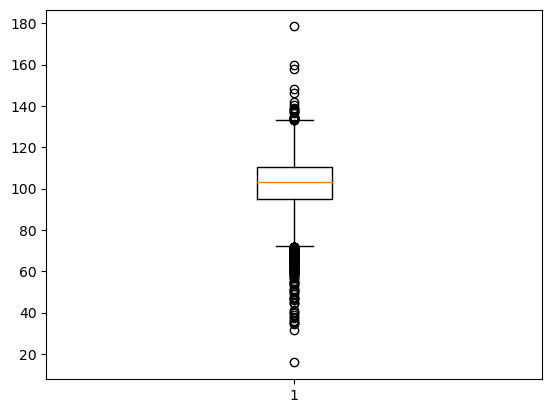

In [21]:
plt.boxplot(df4["Ortg"])

In [22]:
def grubbs_stat_sup(y):
    std_dev = np.std(y)
    avg_y = np.mean(y)
    abs_val_minus_avg = y - avg_y
    max_of_deviations = max(abs_val_minus_avg)
    max_ind = np.argmax(abs_val_minus_avg)
    Gcal = max_of_deviations/ std_dev
    #print("Grubbs Statistics Value : {}".format(Gcal))
    return Gcal, max_ind

#ESD test
def ESD_Test_sup(input_series, alpha, max_outliers):
    input_series = np.array(input_series) #Transformation de la colonne en array
    
    #Initialisation des valeurs
    nb_outliers=0
    valeur_atypique_seuil="-"

    
    #Itération pour chaque valeur de la série
    for iterations in range(max_outliers):
        Gcritical = calculate_critical_value(len(input_series), alpha)
        Gstat, max_index = grubbs_stat_sup(input_series)
        
        #Récupère les valeurs de la dernière itération où la valeur est considéré comme atypique
        if round(Gstat,4)>round(Gcritical,4) :
            nb_outliers+=1
            valeur_atypique_seuil=input_series[max_index]
            last_Gstat=Gstat
            last_Gcritical=Gcritical
        
        #Supprime la valeur de l'itération pour tester sur d'autres
        input_series = np.delete(input_series, max_index)
   
    #Print des résultats du test
    print("Nombre de valeurs atypiques : "+ str(nb_outliers))
    print("Valeur atypique seuil : {}".format(valeur_atypique_seuil))
    
    if nb_outliers>0 :
        print('{} is an outlier. G > G-critical: {:.4f} > {:.4f} \n'.format(valeur_atypique_seuil, last_Gstat, last_Gcritical))
    
    if (max_outliers*0.8)<nb_outliers : #Marge de sécurité
        print('\033[1m' + "Veuillez augmenter le nombre d'outlier max par sécurité"+'\033[0m')
    
    return valeur_atypique_seuil

In [23]:
columns_name=df4.columns
for i in range(3,58) :
    print(columns_name[i])
    ESD_Test_sup(df4.iloc[:,i], 0.05, 1000)
    print('-----------------------------------------------')

GP
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
Min_per
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
Ortg
Nombre de valeurs atypiques : 2
Valeur atypique seuil : 159.6
159.6 is an outlier. G > G-critical: 4.6091 > 4.5859 

-----------------------------------------------
usg
Nombre de valeurs atypiques : 1
Valeur atypique seuil : 42.8
42.8 is an outlier. G > G-critical: 4.8629 > 4.5859 

-----------------------------------------------
eFG
Nombre de valeurs atypiques : 4
Valeur atypique seuil : 88.9
88.9 is an outlier. G > G-critical: 5.0741 > 4.5858 

-----------------------------------------------
TS_per
Nombre de valeurs atypiques : 2
Valeur atypique seuil : 85.6
85.6 is an outlier. G > G-critical: 4.6576 > 4.5859 

-----------------------------------------------
ORB_per
Nombre de valeurs atypiques : 6
Valeur atypique seuil : 25.1
25.1 is an outlier. G > G-critical

Nombre de valeurs atypiques : 77
Valeur atypique seuil : 2.75
2.75 is an outlier. G > G-critical: 4.6018 > 4.5845 

-----------------------------------------------
pts
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------


In [24]:
def grubbs_stat_inf(y):
    std_dev = np.std(y)
    avg_y = np.mean(y)
    abs_val_minus_avg = y - avg_y
    max_of_deviations = abs(min(abs_val_minus_avg))
    max_ind = np.argmin(abs_val_minus_avg)
    Gcal = max_of_deviations/ std_dev
    #print("Grubbs Statistics Value : {}".format(Gcal))
    return Gcal, max_ind

#ESD test
def ESD_Test_inf(input_series, alpha, max_outliers):
    input_series = np.array(input_series) #Transformation de la colonne en array
    
    #Initialisation des valeurs
    nb_outliers=0
    valeur_atypique_seuil="-"

    
    #Itération pour chaque valeur de la série
    for iterations in range(max_outliers):
        Gcritical = calculate_critical_value(len(input_series), alpha)
        Gstat, max_index = grubbs_stat_inf(input_series)
        
        #Récupère les valeurs de la dernière itération où la valeur est considéré comme atypique
        if round(Gstat,4)>round(Gcritical,4) :
            nb_outliers+=1
            valeur_atypique_seuil=input_series[max_index]
            last_Gstat=Gstat
            last_Gcritical=Gcritical
        
        #Supprime la valeur de l'itération pour tester sur d'autres
        input_series = np.delete(input_series, max_index)
   
    #Print des résultats du test
    print("Nombre de valeurs atypiques : "+ str(nb_outliers))
    print("Valeur atypique seuil : {}".format(valeur_atypique_seuil))
    
    if nb_outliers>0 :
        print('{} is an outlier. G > G-critical: {:.4f} > {:.4f} \n'.format(valeur_atypique_seuil, last_Gstat, last_Gcritical))
    
    if (max_outliers*0.8)<nb_outliers : #Marge de sécurité
        print('\033[1m' + "Veuillez augmenter le nombre d'outlier max par sécurité"+'\033[0m')
    
    return valeur_atypique_seuil

In [136]:
columns_name=df4.columns
for i in range(3,58) :
    print(columns_name[i])
    ESD_Test_inf(df4.iloc[:,i], 0.05, 1000)
    print('-----------------------------------------------')

GP
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
Min_per
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
Ortg
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
usg
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
eFG
Nombre de valeurs atypiques : 1
Valeur atypique seuil : 16.7
16.7 is an outlier. G > G-critical: 4.7521 > 4.5676 

-----------------------------------------------
TS_per
Nombre de valeurs atypiques : 3
Valeur atypique seuil : 23.74
23.74 is an outlier. G > G-critical: 4.5893 > 4.5676 

-----------------------------------------------
ORB_per
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-----------------------------------------------
DRB_per
Nombre de valeurs atypiques : 0
Valeur atypique seuil : -
-------------------------------------

### Suppresson des valeurs atypiques

In [137]:
test2 = np.where((df4['ORB_per'] >=25.1)|
                 (df4['AST_per']>=43.9)|
                 (df4['FTM']>=235)|
                 (df4['FTA']>=315)|
                 (df4['FT_per']<=0)|
                 (df4['twoPM']>=311)|
                 (df4['twoPA']>=678)|
                 (df4['TPM']>=129)|
                 (df4['TPA']>=377)|
                 (df4['TP_per']>=1)|
                 (df4['blk_per']>=15.4)|
                 (df4['stl_per']>=5.7)|
                 (df4['ftr']>=122.2)|
                 (df4['pfr']>=11.5)|
                 (df4['ast/tov']>=3.50045005)|
                 (df4['rimmade']>=197)|
                 (df4['rimmade+rimmiss']>=304)|
                 (df4['midmade']>=114)|
                 (df4['midmade+midmiss']>=293)|
                 (df4['dunksmade']>=53)|
                 (df4['dunksmiss+dunksmade']>=59)|
                 (df4['dunksmade/(dunksmade+dunksmiss)']<=0.25)|
                 (df4['oreb']>=4.8889)|
                 (df4['dreb']>=9.7143)|
                 (df4['ast']>=6.6286)|
                 (df4['stl']>=2.7714)|
                 (df4['blk']>=2.75)|
                 (df4['Ortg']>=159.6)|
                 (df4['Ortg']<=44.8)|
                 (df4['usg']>=42.8)|
                 (df4['eFG']>=88.9)|
                 (df4['eFG']<=15.4)|
                 (df4['TS_per']>=85.6)|
                 (df4['TS_per']<=21.51)|
                 (df4['DRB_per']>=37.1)|
                 (df4['TO_per']>=43.7)|
                 (df4['twoP_per']>=0.889)|
                 (df4['twoP_per']<=0.1)|
                 (df4['adjoe']>=185.359)|
                 (df4['adjoe']<=34.2099)|
                 (df4['rimmade/(rimmade+rimmiss)']<=0.1429)|
                 (df4['midmade/(midmade+midmiss)']>=1)|
                 (df4['drtg']<=66.5649)|
                 (df4['bpm']>=22.4742)|
                 (df4['bpm']<=-17.3644)|
                 (df4['obpm']>=16.0952)|
                 (df4['obpm']<=-13.4502)|
                 (df4['dbpm']<=-9.7645)|
                 (df4['gbpm']>=20.995)|
                 (df4['gbpm']<=-17.3008)|
                 (df4['ogbpm']>=16.7663)|
                 (df4['ogbpm']<=-15.7471)|
                 (df4['dgbpm']>=10.1789)|
                 (df4['dgbpm']<=-8.86668))
test2

(array([], dtype=int64),)

In [133]:
df4.drop(test2[0] , inplace=True)
df4.shape

(10245, 59)

### Corrélations 

<AxesSubplot: >

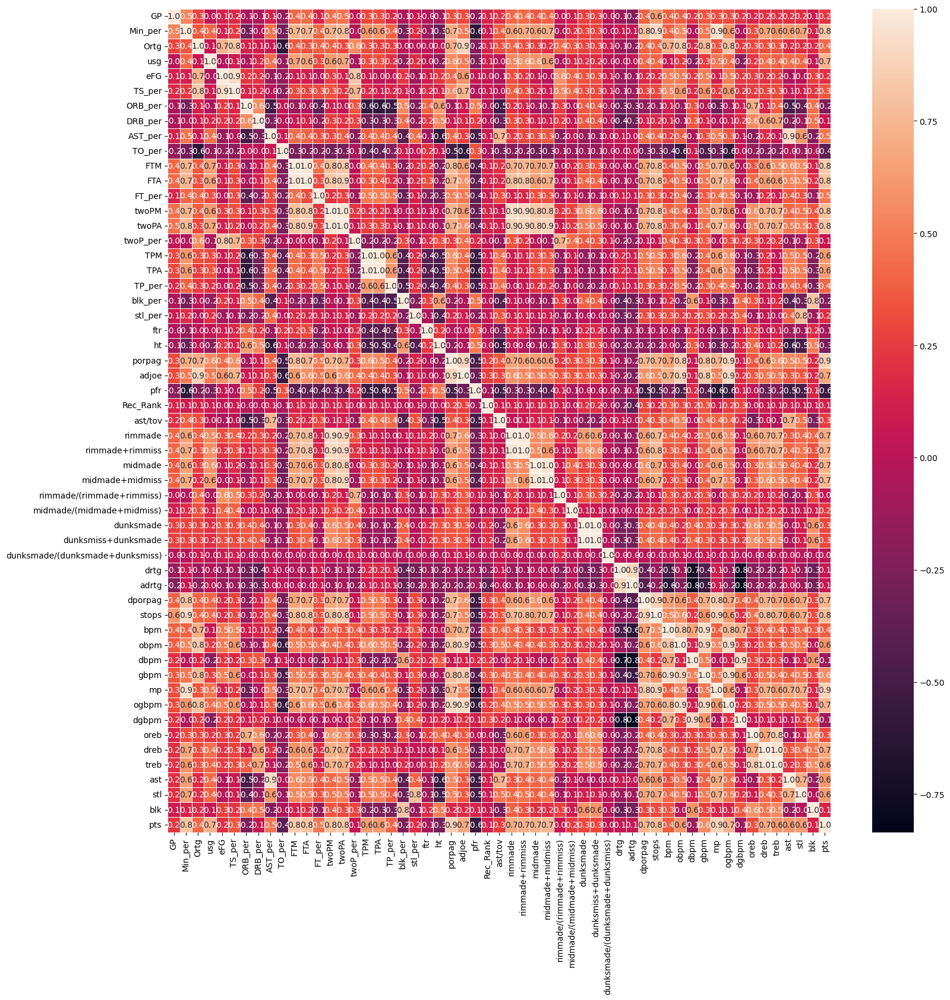

In [138]:
#correlation map
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(df4[columns_name].corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [139]:
m_corr = df4[columns_name].corr()
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(m_corr[abs(m_corr)>=0.90],annot = True, fmt = '.2f')

<AxesSubplot: >

#### Régression Elastic Net 

In [140]:
df4.post

0          Combo G
2        Stretch 4
3           Wing F
4                C
5                C
           ...    
11165       Wing G
11166      Combo G
11167            C
11168       Wing F
11169            C
Name: post, Length: 10245, dtype: object

In [141]:
df4['post'] = df4['post'].map({'Combo G':0,'Pure PG':1,'Scoring PG':2,'Wing G':3,'Wing F':4,'Stretch 4':5,'PF/C':6,'C':7},
                              na_action=None)
df4.post

0        0
2        5
3        4
4        7
5        7
        ..
11165    3
11166    0
11167    7
11168    4
11169    7
Name: post, Length: 10245, dtype: int64

In [142]:
df4['post'] = df4.post.astype('int32')

In [143]:
warnings.filterwarnings('ignore') # setting ignore as a parameter

X, y = df4.iloc[:,3:58], df4.iloc[:,58]
scaler = StandardScaler()
scaler.fit(X)
X_sc = scaler.transform(X)
# define model
model = ElasticNet()
# define model evaluation method
cv = RepeatedKFold(n_splits=5, n_repeats=5)
# define grid
grid = dict()
grid['alpha'] = [1e-3,1e-2, 1e-1, 0.0, 1.0]
grid['l1_ratio'] = np.arange(0, 1, 0.2)
# define search
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X_sc, y)
# summarize
print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.043e+03, tolerance: 4.137e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.091e+03, tolerance: 4.199e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.016e+03, tolerance: 4.136e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.058e+03, tolerance: 4.159e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.265e+02, tolerance: 4.176e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.604e+02, tolerance: 4.155e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.684e+02, tolerance: 4.183e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.375e+01, tolerance: 4.176e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.067e+02, tolerance: 4.188e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.526e+01, tolerance: 4.176e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+01, tolerance: 4.151e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.205e+01, tolerance: 4.203e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.123e+03, tolerance: 4.188e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.126e+03, tolerance: 4.183e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.547e+03, tolerance: 4.199e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.497e+03, tolerance: 4.145e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.477e+03, tolerance: 4.136e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.502e+03, tolerance: 4.159e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.082e+03, tolerance: 4.199e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Rid

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.006e+03, tolerance: 4.136e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.074e+03, tolerance: 4.196e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.082e+03, tolerance: 4.199e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.034e+03, tolerance: 4.176e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.035e+03, tolerance: 4.155e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.055e+03, tolerance: 4.184e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.041e+03, tolerance: 4.182e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.046e+03, tolerance: 4.183e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.085e+03, tolerance: 4.215e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.037e+03, tolerance: 4.145e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.049e+03, tolerance: 4.188e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.070e+03, tolerance: 4.173e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.033e+03, tolerance: 4.137e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.016e+03, tolerance: 4.156e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.049e+03, tolerance: 4.159e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: UserWarning: Coordinate descent with no regularization may lead to unexpected results 

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.648e+03, tolerance: 4.182e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.692e+03, tolerance: 4.199e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.671e+03, tolerance: 4.173e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/NLP/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.678e+03, tolerance: 4.215e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemen

MAE: -0.676
Config: {'alpha': 0.001, 'l1_ratio': 0.2}


In [144]:
model = ElasticNet(alpha=0.001,l1_ratio=0.2)
model.fit(X_sc, y)

ElasticNet(alpha=0.001, l1_ratio=0.2)

In [145]:
model.coef_

array([ 4.12262625e-02, -1.09258306e-01,  2.34457434e-02,  5.38985933e-04,
        0.00000000e+00,  1.00786845e-01,  2.95477110e-01,  1.76447224e-01,
       -2.68752378e-01, -1.39852904e-01, -2.29781549e-02, -2.24825959e-02,
       -6.66499775e-03, -2.99034492e-07,  1.37950994e-01, -9.02398800e-02,
        1.04982591e-01, -1.91098583e-01, -4.16548077e-01, -1.31471125e-01,
       -2.22364870e-01, -4.20539829e-02,  6.91727120e-01,  3.06981774e-01,
       -3.44031122e-01,  3.41422261e-01, -1.55508366e-02, -1.78148072e-01,
       -1.78744902e-01,  1.25319485e-01, -8.24259061e-02,  8.83033098e-02,
        1.42945638e-01,  5.55675983e-02, -8.74183662e-02,  2.59589234e-02,
        1.30403164e-02, -7.88263900e-02,  9.50882263e-02, -4.38182452e-02,
       -1.48719874e-02, -0.00000000e+00, -2.16547193e-01,  3.44083505e-01,
        8.86752945e-02, -1.28478751e-01,  3.64406346e-01, -2.84425490e-01,
        6.69427501e-02,  7.80371465e-02,  5.98719503e-02,  2.57914561e-01,
       -7.57540361e-02,  

In [146]:
columns_name[[7,16,44]]

Index(['eFG', 'twoPM', 'bpm'], dtype='object')

In [147]:
df5=df4.drop(axis=1, columns=columns_name[[7,16,44]])
print(df5.shape)

(10245, 56)


In [148]:
columns_name2=df5.columns
m_corr = df5[columns_name2].corr()
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(m_corr[abs(m_corr)>=0.90],annot = True, fmt = '.2f')

<AxesSubplot: >

In [39]:
correlation = df5.loc[:,('Min_per','FTM','FTA','TPM','TPA','adjoe','rimmade','rimmade+rimmiss','midmade',
                        'midmade+midmiss','dunksmade','dunksmiss+dunksmade','stops','obpm','dbpm','mp',
                        'ogbpm','dgbpm','dreb','treb','ast','AST_per')]
correlation

,Min_per,FTM,FTA,TPM,TPA,adjoe,rimmade,rimmade+rimmiss,midmade,midmade+midmiss,...,stops,obpm,dbpm,mp,ogbpm,dgbpm,dreb,treb,ast,AST_per
0,76.2,73,107,59,125,111.6740,47.0,78.0,19.0,58.0,...,215.8570,3.665330,2.412160,30.6857,2.914710,2.338340,3.2286,4.5714,1.8000,12.3
2,21.7,1,2,20,65,83.1609,6.0,8.0,2.0,10.0,...,43.9181,-2.687130,-2.474130,10.6296,-3.865000,-1.647590,0.9630,1.2222,0.3704,6.9
3,73.6,67,92,13,37,115.1010,78.0,124.0,73.0,170.0,...,183.5350,2.748010,2.389770,29.7812,2.262140,1.599990,3.0938,5.0000,0.7812,4.8
4,62.5,47,80,0,0,120.7210,121.0,164.0,35.0,93.0,...,150.8960,3.564200,1.737970,25.2647,3.802010,1.053410,2.8529,5.5294,0.7647,6.5
5,60.4,31,66,0,0,93.7875,59.0,116.0,0.0,6.0,...,151.2250,0.187429,3.409080,24.3548,-1.113090,0.657833,3.6774,7.0323,0.9032,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11165,64.9,39,60,7,25,86.6839,30.0,52.0,4.0,15.0,...,117.7910,-2.370870,2.512760,25.9565,-3.222900,1.894790,3.0435,3.5217,1.9130,16.2
11166,40.0,22,31,10,28,84.1020,19.0,40.0,11.0,29.0,...,58.4960,-2.943680,-2.126600,19.4000,-3.725650,-1.861870,1.2500,1.7000,1.2000,11.0
11167,12.9,7,13,0,0,124.9010,14.0,18.0,5.0,6.0,...,28.3658,2.194120,6.280070,9.0625,1.368160,4.294650,0.6250,1.2500,0.1250,2.4
11168,17.1,3,5,1,14,94.7114,15.0,29.0,5.0,12.0,...,24.1790,-1.684990,-0.070876,14.6667,-1.246090,0.529388,1.6667,2.6667,0.4444,6.5


In [149]:
columns_name2=correlation.columns
m_corr = correlation[columns_name2].corr()
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(m_corr[abs(m_corr)>=0.90],annot = True, fmt = '.2f')

<AxesSubplot: >

In [41]:
df6=df5.drop(labels=["Min_per","FTM","FTA","TPM","TPA","rimmade","rimmade+rimmiss","midmade","midmade+midmiss",
                    "dunksmade","dunksmiss+dunksmade","ogbpm","dgbpm","treb","AST_per"],axis=1)
df6.head()

,player_name,team,conf,GP,Ortg,usg,TS_per,ORB_per,DRB_per,TO_per,...,dbpm,gbpm,mp,oreb,dreb,ast,stl,blk,pts,post
0,Carlos Strong,Boston University,AE,35,118.1,16.4,60.93,4.7,11.5,15.1,...,2.41216,5.253060,30.6857,1.3429,3.2286,1.8000,1.6571,0.4000,10.8571,0
2,Matt Parker,James Madison,CAA,27,87.9,16.2,45.32,2.9,9.8,19.0,...,-2.47413,-5.512590,10.6296,0.2593,0.9630,0.3704,0.1481,0.2963,2.8519,5
3,Landon Milbourne,Maryland,ACC,32,109.2,20.1,54.44,7.2,10.4,13.6,...,2.38977,3.862130,29.7812,1.9062,3.0938,0.7812,1.1562,1.1875,12.7500,4
4,Vernon Macklin,Florida,SEC,34,116.3,19.8,60.85,11.9,12.9,16.2,...,1.73797,4.855430,25.2647,2.6765,2.8529,0.7647,0.5882,0.8529,10.5588,7
5,Sean Carter,Massachusetts,A10,31,101.7,13.4,48.58,14.0,16.1,20.2,...,3.40908,-0.455255,24.3548,3.3548,3.6774,0.9032,0.5484,1.2903,4.8065,7


In [154]:
columns_name2=df6.columns
m_corr = df6[columns_name2].corr()
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(m_corr[abs(m_corr)>=0.90],annot = True, fmt = '.2f')

<AxesSubplot: >

In [43]:
df6.shape

(10245, 41)

## Modélisation multiclasse 

In [44]:
X_train, X_test, y_train, y_test = train_test_split(df6.iloc[:,3:40],  
                                                    df6['post'], 
                                                    test_size=0.2)

In [155]:
X_test

,GP,Ortg,usg,TS_per,ORB_per,DRB_per,TO_per,FT_per,twoPA,twoP_per,...,obpm,dbpm,gbpm,mp,oreb,dreb,ast,stl,blk,pts
7134,35,114.4,18.7,54.05,2.0,12.1,10.3,0.837,135,0.504,...,4.445190,1.657640,5.159790,27.4571,0.4571,2.6857,2.4857,1.0571,0.0571,10.2000
5195,20,104.1,21.4,52.59,1.3,10.3,18.9,0.667,69,0.420,...,2.866050,1.698430,4.150570,19.3000,0.2000,1.8000,1.7500,0.9500,0.0500,7.4500
344,31,98.7,18.8,51.60,11.0,14.4,22.0,0.686,115,0.478,...,-0.660480,1.892100,-1.179440,17.0968,1.5484,2.0323,0.8710,0.4516,0.6452,4.9677
3966,4,71.0,19.3,36.72,1.1,10.1,42.1,1.000,17,0.353,...,-5.908250,0.611548,-1.110070,26.5000,0.2500,2.2500,5.0000,1.7500,0.2500,3.7500
5891,36,112.0,19.6,53.37,1.9,8.5,10.3,0.846,174,0.477,...,3.317540,1.953020,5.599190,27.1667,0.5000,2.1944,1.5833,1.1389,0.1389,11.6111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,27,72.3,10.7,40.43,7.6,10.4,29.5,0.414,53,0.396,...,-6.601590,0.201069,-6.793340,16.4815,1.0741,1.5556,0.0000,0.3333,0.7407,2.0000
3151,27,94.2,15.6,43.60,3.6,11.9,13.1,0.615,45,0.400,...,-0.874508,-0.020606,-0.693973,14.5926,0.4444,1.4444,0.8519,0.7037,0.0000,3.3704
640,34,89.9,16.0,45.59,0.7,7.4,28.4,0.862,46,0.391,...,-2.107190,-1.130310,-2.831120,10.6176,0.0588,0.7059,1.2941,0.3235,0.0588,2.0588
6509,30,90.5,15.0,42.32,3.5,7.3,16.5,0.759,80,0.362,...,-1.751680,-1.724150,-4.856060,21.6000,0.7000,1.4000,0.7000,0.4000,0.4000,5.4667


In [46]:
scaler = StandardScaler()

scaler.fit(X_train)

X_train_sc = scaler.transform(X_train)
X_test_sc = scaler.transform(X_test)

### Création des modèles

### SVC

In [47]:
# define model
c_svc_ovo = SVC(decision_function_shape='ovo')
# define grid
params = [
    {"kernel": ["rbf"], "gamma": [0.1,0.5,1], "C": [0.1,1, 10]},
    {"kernel": ["poly"], "degree":[1,2,3],"C": [0.1,1, 10]},
    {"kernel": ["linear"],"C": [0.1,1, 10]}]
# define search
search_ovo = GridSearchCV(c_svc_ovo, params, scoring='neg_mean_absolute_error', cv=5)
# perform the search
results_ovo = search_ovo.fit(X_train_sc, y_train)
# summarize
print('MAE: %.3f' % results_ovo.best_score_)
print('Config: %s' % results_ovo.best_params_)

MAE: -0.203
Config: {'C': 10, 'degree': 1, 'kernel': 'poly'}


In [48]:
c_svc_ovo = SVC(decision_function_shape='ovo', kernel = 'poly', degree = 1, C=10)

In [49]:
# define model
c_svc_ovr = SVC(decision_function_shape='ovr')
# define grid
params = [
    {"kernel": ["rbf"], "gamma": [0.1,0.5,1], "C": [0.1,1, 10]},
    {"kernel": ["poly"], "degree":[1,2,3],"C": [0.1,1, 10]},
    {"kernel": ["linear"],"C": [0.1,1, 10]}]
# define search
search_ovr = GridSearchCV(c_svc_ovr, params, scoring='neg_mean_absolute_error', cv=5)
# perform the search
results_ovr = search_ovr.fit(X_train_sc, y_train)
# summarize
print('MAE: %.3f' % results_ovr.best_score_)
print('Config: %s' % results_ovr.best_params_)

MAE: -0.203
Config: {'C': 10, 'degree': 1, 'kernel': 'poly'}


In [50]:
c_svc_ovr = SVC(decision_function_shape='ovr', kernel = 'poly', degree = 1, C=10)

In [51]:
#Declare modèle
OVO_SVC = OneVsOneClassifier(c_svc_ovo)
OVR_SVC = OneVsRestClassifier(c_svc_ovr)
#Fit the model
OVO_SVC.fit(X_train_sc, y_train)
OVR_SVC.fit(X_train_sc, y_train)

OneVsRestClassifier(estimator=SVC(C=10, degree=1, kernel='poly'))

### Modélisation OVO

In [52]:
#Pour chaque target on obtient une probabilité de score d'appartenance à un poste
OVO_SVC.decision_function(X_train_sc)

array([[ 1.6875749 , -0.32280118,  0.67804626, ...,  6.32044198,
         7.31907952,  4.02708524],
       [ 3.27937972, -0.32068269,  0.68714779, ...,  5.30924331,
         3.79225331,  1.68129025],
       [ 1.84522429, -0.32153306,  0.68579084, ...,  5.28890865,
         4.28215209,  2.68998715],
       ...,
       [ 2.17201971, -0.32171084,  0.68356043, ...,  4.76352789,
         4.28394962,  2.69002227],
       [ 2.24399164, -0.32077416,  0.68601829, ...,  5.22563612,
         4.12073038,  2.68905396],
       [ 5.28265467, -0.30824855,  2.84019956, ...,  4.067009  ,
         1.71501859,  0.68150636]])

In [53]:
#On prend le score avec la probabilité max
np.argmax(OVO_SVC.decision_function(X_train_sc), axis=1)

array([6, 4, 4, ..., 4, 3, 3])

#### Qualité de prédiction du modèle

In [54]:
confusion_matrix(OVO_SVC.predict(X_test_sc), y_test)

array([[209,   0,  14,  12,   1,   0,   0,   0],
       [  0,  18,   3,   0,   0,   0,   0,   0],
       [  8,   4, 110,   0,   0,   0,   0,   0],
       [ 11,   0,   0, 415,  26,   1,   1,   0],
       [  0,   0,   0,  17, 233,  20,  23,   0],
       [  0,   0,   0,   2,   4,  95,  38,   0],
       [  0,   0,   0,   1,  27,  29, 242,  29],
       [  0,   0,   0,   0,   0,   0,  31, 425]])

In [55]:
x=confusion_matrix(OVO_SVC.predict(X_test_sc), y_test)
np.savetxt('OVO_MC.txt', x, delimiter=',')

### Modélisation OVR

In [56]:
#Pour chaque target on obtient une probabilité de score d'appartenance à un poste
OVR_SVC.decision_function(X_train_sc)

array([[ -8.41802099, -10.58246844,  -8.2921529 , ...,  -1.00009281,
         -0.45899668,  -4.11846303],
       [ -2.20119262, -11.18366089,  -5.5757311 , ...,  -0.99974342,
         -1.99266658,  -8.62405557],
       [ -4.11493537, -11.43021576,  -6.3598282 , ...,  -1.00007921,
         -1.03672839,  -5.74618339],
       ...,
       [ -2.85434835, -11.67494666,  -6.05637188, ...,  -1.00034059,
         -0.90167222,  -6.51705214],
       [ -3.25987549, -10.60846963,  -6.10841972, ...,  -1.00014656,
         -1.40473369,  -5.56846796],
       [ -2.53486818,  -5.55982862,  -2.17645098, ...,  -0.9999487 ,
         -1.65517678,  -6.67291273]])

In [57]:
#On prend le score avec la probabilité max
np.argmax(OVR_SVC.decision_function(X_train_sc), axis=1)

array([6, 3, 3, ..., 3, 3, 4])

#### Qualité de prédiction du modèle

In [58]:
confusion_matrix(OVR_SVC.predict(X_test_sc), y_test)

array([[110,   0,  35,  16,   3,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [ 23,  22,  92,   1,   2,   0,   0,   0],
       [ 72,   0,   0, 370, 179,  44,  13,   1],
       [ 13,   0,   0,  37,  27,  14,  29,   1],
       [ 10,   0,   0,  18,  19,  29,  19,   0],
       [  0,   0,   0,   5,  56,  57, 213,  17],
       [  0,   0,   0,   0,   5,   1,  61, 435]])

In [59]:
x2=confusion_matrix(OVR_SVC.predict(X_test_sc), y_test)
np.savetxt('OVR_MC.txt', x2, delimiter=',')

### Modélisation MLP avec Keras

In [60]:
X_train.shape

(8196, 37)

In [61]:
def build_model(n_hidden, n_neurons, lr,input_shape=[37]):
    #Define sequential model
    model = keras.models.Sequential()
    #Input shape
    model.add(keras.layers.Flatten(input_shape=input_shape))
    #Add hidden layer with loop
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation="relu"))
    #Ouput layer    
    model.add(keras.layers.Dense(8, activation="softmax"))
    #Define optimizer
    optimizer = keras.optimizers.SGD(learning_rate=lr)
    #Compile model
    model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])
    return(model)

In [62]:
keras_reg = KerasRegressor(build_model)

In [63]:
#On tune notre modèle
param_distribs = {
"model__n_hidden": [1, 2, 3],
"model__n_neurons":[100,300,500],
"model__lr":  [0.001, 0.01, 0.1]
}

#grid search
rnd_search_cv = GridSearchCV(keras_reg, param_distribs,cv=5)

#Fit model with grid search
rnd_search_cv.fit(X_train, y_train)
print(rnd_search_cv.best_params_, rnd_search_cv.best_score_)

2023-02-02 17:53:26.273895: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


205/205 [==============================] - 1s 3ms/step - loss: 7.2007 - accuracy: 0.2335


52/52 [==============================] - 0s 2ms/step


257/257 [==============================] - 1s 2ms/step - loss: 5.3170 - accuracy: 0.2973
{'model__lr': 0.001, 'model__n_hidden': 1, 'model__n_neurons': 100} nan


In [162]:
model = keras.models.Sequential([
keras.layers.Flatten(input_shape=[37]),
keras.layers.Dense(100, activation="relu"),
keras.layers.Dense(8, activation="softmax")
])

In [163]:
w, biais = model.layers[1].get_weights()
#Print weights
print(w)

#Format de sortie
print(w.shape)

[[-0.05733684  0.0259262   0.09689994 ... -0.15768385  0.19597493
   0.08371936]
 [ 0.0988666  -0.17819855 -0.01718992 ... -0.11572255  0.15631439
   0.05293427]
 [ 0.18700053 -0.08905776 -0.0510904  ...  0.03612055  0.10843815
   0.04008445]
 ...
 [ 0.12341814 -0.09329084 -0.02803859 ...  0.07559977 -0.09845969
   0.07020225]
 [-0.04474138 -0.144191   -0.05626798 ... -0.17002927 -0.14219016
   0.0507399 ]
 [-0.04349969 -0.13074672 -0.00580281 ... -0.03542024  0.12733383
   0.08216174]]
(37, 100)


In [164]:
optimizer = keras.optimizers.SGD(learning_rate=0.001)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer="sgd",
              metrics=["accuracy"])

In [165]:
train_model = model.fit(X_train, y_train, epochs=30,  validation_split=0.1)

Epoch 1/30
215/215 [==============================] - 4s 15ms/step - loss: 3.9021 - accuracy: 0.5771 - val_loss: 1.5430 - val_accuracy: 0.5709
Epoch 2/30
215/215 [==============================] - 1s 3ms/step - loss: 1.3094 - accuracy: 0.5904 - val_loss: 1.2276 - val_accuracy: 0.5709
Epoch 3/30
215/215 [==============================] - 1s 3ms/step - loss: 1.1148 - accuracy: 0.5994 - val_loss: 1.0510 - val_accuracy: 0.5709
Epoch 4/30
215/215 [==============================] - 1s 3ms/step - loss: 0.9809 - accuracy: 0.5999 - val_loss: 0.9517 - val_accuracy: 0.5709
Epoch 5/30
215/215 [==============================] - 1s 3ms/step - loss: 0.9027 - accuracy: 0.6025 - val_loss: 0.8906 - val_accuracy: 0.5709
Epoch 6/30
215/215 [==============================] - 1s 3ms/step - loss: 0.8550 - accuracy: 0.5994 - val_loss: 0.8510 - val_accuracy: 0.5709
Epoch 7/30
215/215 [==============================] - 1s 3ms/step - loss: 0.8223 - accuracy: 0.5993 - val_loss: 0.8231 - val_accuracy: 0.5709
Epoch

In [166]:
#Paramètre du modèle
train_model.params
#Dictionnaire modèle history
train_model.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

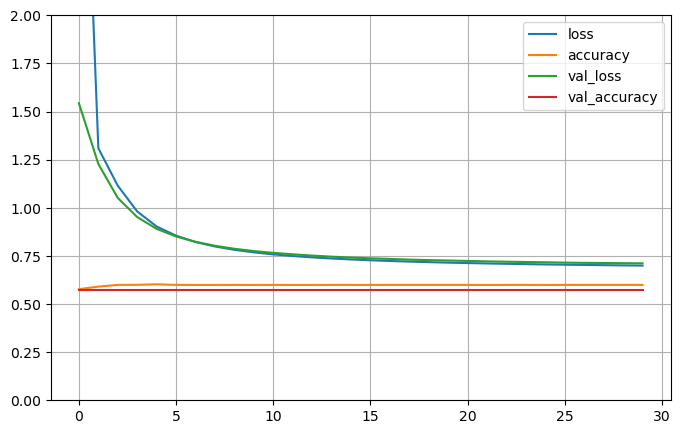

In [167]:
#Data to pandas dataframe
pd.DataFrame(train_model.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 2) 
plt.show()

### Conclusion pour les modèles multiclasse

In [168]:
df6['post'].value_counts()

3    2343
7    2311
6    1568
4    1373
0    1185
5     730
2     621
1     114
Name: post, dtype: int64

## Modélisation binaire

### Création de la variable binaire

In [70]:
df7=df2
df7['post']=df7.post.map({'Combo G':0,'Pure PG':0,'Scoring PG':0,'Wing G':0,'Wing F':0,'Strecth 4':1,'PF/C':1,'C':1},
                              na_action=None)
print(df7.info())
df7.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61061 entries, 0 to 61060
Data columns (total 59 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   player_name                      61061 non-null  object 
 1   team                             61061 non-null  object 
 2   conf                             61061 non-null  object 
 3   GP                               61061 non-null  int64  
 4   Min_per                          61061 non-null  float64
 5   Ortg                             61061 non-null  float64
 6   usg                              61061 non-null  float64
 7   eFG                              61061 non-null  float64
 8   TS_per                           61061 non-null  float64
 9   ORB_per                          61061 non-null  float64
 10  DRB_per                          61061 non-null  float64
 11  AST_per                          61061 non-null  float64
 12  TO_per            

(61061, 59)

In [71]:
df8 = df7.dropna(axis=0)
df8.shape

(10411, 59)

In [72]:
#Réindexation de notre base
s = pd.Series(range(0,10411))
df9 = df8.set_index(s)

#Suppression des valeurs atypiques
test2 = np.where((df9['ORB_per'] >=25.1)|
                 (df9['AST_per']>=43.9)|
                 (df9['FTM']>=235)|
                 (df9['FTA']>=315)|
                 (df9['FT_per']<=0)|
                 (df9['twoPM']>=311)|
                 (df9['twoPA']>=678)|
                 (df9['TPM']>=129)|
                 (df9['TPA']>=377)|
                 (df9['TP_per']>=1)|
                 (df9['blk_per']>=15.4)|
                 (df9['stl_per']>=5.7)|
                 (df9['ftr']>=122.2)|
                 (df9['pfr']>=11.5)|
                 (df9['ast/tov']>=3.50045005)|
                 (df9['rimmade']>=197)|
                 (df9['rimmade+rimmiss']>=304)|
                 (df9['midmade']>=114)|
                 (df9['midmade+midmiss']>=293)|
                 (df9['dunksmade']>=53)|
                 (df9['dunksmiss+dunksmade']>=59)|
                 (df9['dunksmade/(dunksmade+dunksmiss)']<=0.25)|
                 (df9['oreb']>=4.8889)|
                 (df9['dreb']>=9.7143)|
                 (df9['ast']>=6.6286)|
                 (df9['stl']>=2.7714)|
                 (df9['blk']>=2.75)|
                 (df9['Ortg']>=159.6)|
                 (df9['Ortg']<=44.8)|
                 (df9['usg']>=42.8)|
                 (df9['eFG']>=88.9)|
                 (df9['eFG']<=15.4)|
                 (df9['TS_per']>=85.6)|
                 (df9['TS_per']<=21.51)|
                 (df9['DRB_per']>=37.1)|
                 (df9['TO_per']>=43.7)|
                 (df9['twoP_per']>=0.889)|
                 (df9['twoP_per']<=0.1)|
                 (df9['adjoe']>=185.359)|
                 (df9['adjoe']<=34.2099)|
                 (df9['rimmade/(rimmade+rimmiss)']<=0.1429)|
                 (df9['midmade/(midmade+midmiss)']>=1)|
                 (df9['drtg']<=66.5649)|
                 (df9['bpm']>=22.4742)|
                 (df9['bpm']<=-17.3644)|
                 (df9['obpm']>=16.0952)|
                 (df9['obpm']<=-13.4502)|
                 (df9['dbpm']<=-9.7645)|
                 (df9['gbpm']>=20.995)|
                 (df9['gbpm']<=-17.3008)|
                 (df9['ogbpm']>=16.7663)|
                 (df9['ogbpm']<=-15.7471)|
                 (df9['dgbpm']>=10.1789)|
                 (df9['dgbpm']<=-8.86668))
test2
df9.drop(test2[0] , inplace=True)
print(df9.shape)

# Suppression des variables avec une corrélation trop importante
df10=df9.drop(axis=1, columns=columns_name[[7,16,44]])
print(df9.shape)
df11=df10.drop(labels=["Min_per","FTM","FTA","TPM","TPA","rimmade","rimmade+rimmiss","midmade","midmade+midmiss",
                    "dunksmade","dunksmiss+dunksmade","ogbpm","dgbpm","treb","AST_per"],axis=1)
print(df11.shape)
df11.head()

(9515, 59)
(9515, 59)


,player_name,team,conf,GP,Ortg,usg,TS_per,ORB_per,DRB_per,TO_per,...,dbpm,gbpm,mp,oreb,dreb,ast,stl,blk,pts,post
0,Carlos Strong,Boston University,AE,35,118.1,16.4,60.93,4.7,11.5,15.1,...,2.41216,5.253060,30.6857,1.3429,3.2286,1.8000,1.6571,0.4000,10.8571,0.0
2,Landon Milbourne,Maryland,ACC,32,109.2,20.1,54.44,7.2,10.4,13.6,...,2.38977,3.862130,29.7812,1.9062,3.0938,0.7812,1.1562,1.1875,12.7500,0.0
3,Vernon Macklin,Florida,SEC,34,116.3,19.8,60.85,11.9,12.9,16.2,...,1.73797,4.855430,25.2647,2.6765,2.8529,0.7647,0.5882,0.8529,10.5588,1.0
4,Sean Carter,Massachusetts,A10,31,101.7,13.4,48.58,14.0,16.1,20.2,...,3.40908,-0.455255,24.3548,3.3548,3.6774,0.9032,0.5484,1.2903,4.8065,1.0
5,Matt Howard,Butler,Horz,38,111.7,24.8,58.40,9.3,16.6,15.8,...,2.72165,3.300440,25.2368,1.7895,3.3684,0.7895,0.5789,0.6053,11.5526,0.0


In [169]:
df11['post'].value_counts()

0.0    5636
1.0    3879
Name: post, dtype: int64

## Modélisation binaire

### Découpage de la base en train/test

In [73]:
X_train, X_test, y_train, y_test = train_test_split(df11.iloc[:,3:40],  
                                                    df11['post'], 
                                                    test_size=0.2)

In [74]:
scaler = StandardScaler()

scaler.fit(X_train)

X_train_sc = scaler.transform(X_train)
X_test_sc = scaler.transform(X_test)

In [75]:
print(y_train.value_counts())
print(y_test.value_counts())

0.0    4540
1.0    3072
Name: post, dtype: int64
0.0    1096
1.0     807
Name: post, dtype: int64


### SVM Linéaire

In [76]:
#Regression logistique
lgr = LogisticRegression( random_state=42)
lgr.fit(X_train_sc, y_train)

#Linear SVM
l_SVC = LinearSVC(random_state=42, max_iter=2000)
l_SVC.fit(X_train_sc, y_train)

#SVM avec kernel
svc = SVC(kernel='linear',random_state=42)
svc.fit(X_train_sc,y_train)

#SGD classifier
sgdc_svm = SGDClassifier(loss='hinge' ,random_state=42)
sgdc_svm.fit(X_train_sc, y_train)

SGDClassifier(random_state=42)

In [77]:
# Get cross_val_score for each function

cvs_lgr = cross_val_score(lgr, X_train_sc, y_train, cv=5, scoring='accuracy')

cvs_lsvc = cross_val_score(l_SVC, X_train_sc, y_train, cv=5, scoring='accuracy')

cvs_svc = cross_val_score(svc, X_train_sc, y_train, cv=5, scoring='accuracy')

cvs_sgdc = cross_val_score(sgdc_svm, X_train_sc, y_train, cv=5, scoring='accuracy')

In [78]:
#Get data output from cross_val_score
df_cross = pd.DataFrame(np.transpose(np.c_[cvs_lgr,cvs_lsvc,cvs_sgdc,cvs_svc]), 
                        columns=['fold1','fold2','fold3','fold4','fold5'])
#Adding model label
df_cross['model'] = ['lgr','lsvc','sgdc','svc']

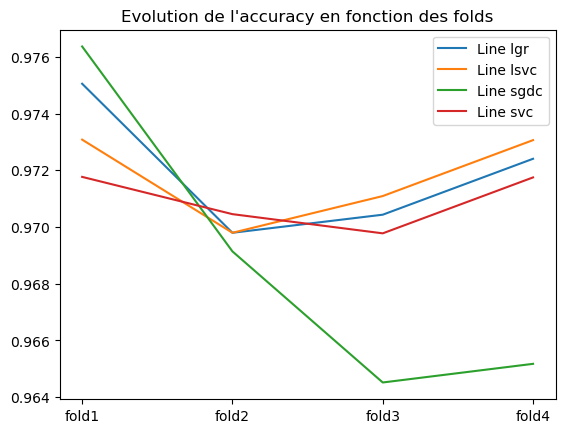

In [79]:
#Regardons l'évolution des scores pour chaque fold
for row in range(df_cross.shape[0]):
    plt.plot( df_cross.iloc[row,0:4] ,label='Line '+str(df_cross.iloc[row,5]))

plt.legend()
plt.title("Evolution de l'accuracy en fonction des folds")
plt.show()

In [80]:
df_cross.head(5)

,fold1,fold2,fold3,fold4,fold5,model
0,0.975049,0.969796,0.970434,0.972405,0.973062,lgr
1,0.973079,0.969796,0.971091,0.973062,0.973719,lsvc
2,0.976362,0.969140,0.964520,0.965177,0.957293,sgdc
3,0.971766,0.970453,0.969777,0.971748,0.973719,svc


In [81]:
for i in range(4):

    mean_model = df_cross.iloc[:,0:5].mean(axis=1)[i]
    std_model = df_cross.iloc[:,0:5].std(axis=1)[i]
    
    print('Le modèle N° '+ str(i+1) + ' a une accuray de '  + str(mean_model) + ' et un std : ' + str(std_model))

Le modèle N° 1 a une accuray de 0.9721491661367573 et un std : 0.002108724850335016
Le modèle N° 2 a une accuray de 0.9721494249799182 et un std : 0.0016445092544849502
Le modèle N° 3 a une accuray de 0.9664986199345471 et un std : 0.006976263598953939
Le modèle N° 4 a une accuray de 0.9714924810375815 et un std : 0.0015100635562785936


In [96]:
params = {
    "tol" : [0.00001,0.0001,0.001,0.01,0.1,0.5],
    "C" : [0, 0.1, 0.5, 1, 10]
        }

c_svc = LinearSVC()
grid_c_svc = GridSearchCV(c_svc, param_grid=params, cv=5, return_train_score=True)
take_grid = grid_c_svc.fit(X_train_sc, y_train)
print("La meilleur combinaison d'estimateur est: " + str(take_grid.best_params_)+"\n"
      "pour un score de: " + str(take_grid.best_score_))

La meilleur combinaison d'estimateur est: {'C': 10, 'tol': 0.001}
pour un score de: 0.9728060237980403


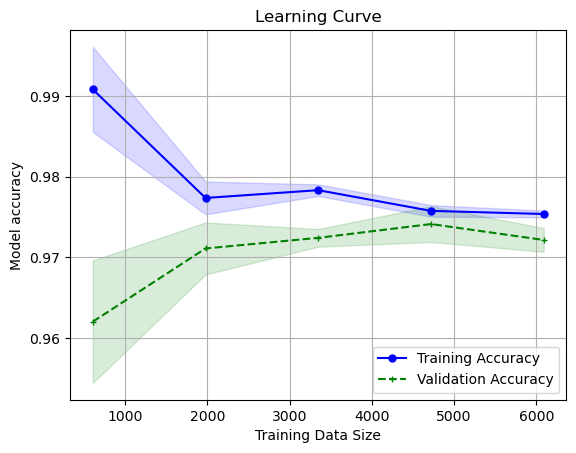

In [97]:
train_sizes, train_scores, test_scores = learning_curve(estimator=c_svc, 
                                                        X=X_train_sc, 
                                                        y=y_train,
                                                        cv=5, 
                                                        train_sizes=np.linspace(0.1, 1.0, 5),
                                                        random_state=42
                                                       )

#
# Trop de fluctuation dans le modèle, on calcule la moyenne des métriques
#
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)
#
# Plot the learning curve
#
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', marker='+', markersize=5, linestyle='--', label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Data Size')
plt.ylabel('Model accuracy')
plt.grid()
plt.legend(loc='lower right')
plt.show()

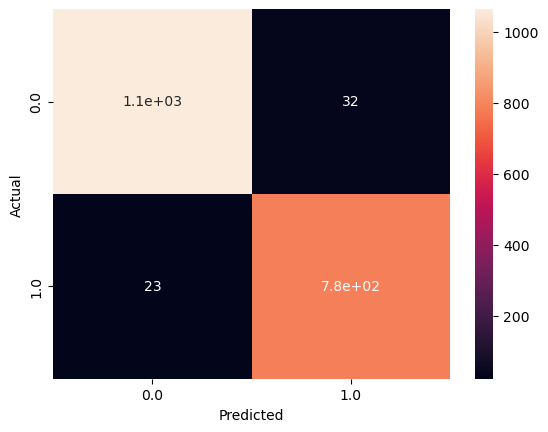

In [98]:
best_svc = LinearSVC(C=10, tol=0.001)
best_svc.fit(X_train_sc, y_train)

confusion_matrix = pd.crosstab(y_test, best_svc.predict(X_test_sc), rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)
plt.show()

In [99]:
print('Training score: ' + str(best_svc.score(X_train_sc,y_train)), 
      '\n',
      'Test score: ' + str(best_svc.score(X_test_sc, y_test))
     )

Training score: 0.9743825538623226 
 Test score: 0.9710982658959537


In [171]:
print(classification_report(y_test, best_svc.predict(X_test_sc)))

              precision    recall  f1-score   support

         0.0       0.98      0.97      0.97      1096
         1.0       0.96      0.97      0.97       807

    accuracy                           0.97      1903
   macro avg       0.97      0.97      0.97      1903
weighted avg       0.97      0.97      0.97      1903



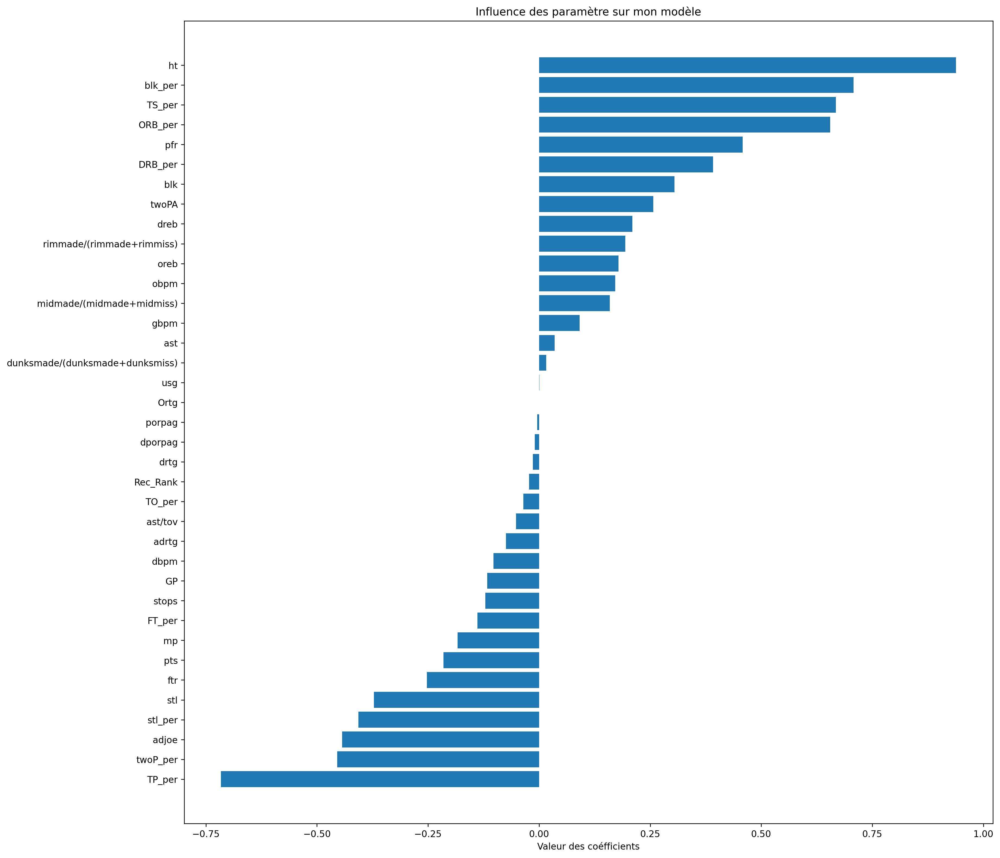

In [112]:
columns_namebis=df11.columns[3:40]
plt.figure(figsize=(16,16), dpi = 240)
plt.title('Influence des paramètre sur mon modèle')
plt.xlabel('Valeur des coéfficients')
svm_f_importances(best_svc.coef_[0], columns_namebis)

In [179]:
df11[['ht','blk_per','TS_per','TP_per','twoP_per','adjoe','stl_per','post']].groupby('post').mean()

,ht,blk_per,TS_per,TP_per,twoP_per,adjoe,stl_per
post,,,,,,,
0.0,194.842974,1.284013,52.699370,0.322076,0.479910,105.156060,2.073439
1.0,205.937097,4.951250,54.249582,0.105795,0.530486,102.958797,1.379557
